In [116]:
import numpy as np
from numpy.linalg import norm
import pickle
from tqdm import tqdm, tqdm_notebook
import random
import time
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
import PIL
from PIL import Image
from sklearn.neighbors import NearestNeighbors
import tensorflow as tf
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input
from PIL import Image

import glob
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [119]:
class_ids = pickle.load(open('/content/drive/My Drive/ds/pizza_images/autoencoder/new_resnet_classids.pickle','rb'))
filenames = pickle.load(open('/content/drive/My Drive/ds/pizza_images/autoencoder/new_filenames_images.pickle', 'rb'))
feature_list = pickle.load(open('/content/drive/My Drive/ds/pizza_images/autoencoder/new_features-resnet.pickle', 'rb'))
featuretensor_list = pickle.load(open('/content/drive/My Drive/ds/pizza_images/autoencoder/new_features_tensors-resnet.pickle', 'rb'))
# filenames = pickle.load(open('/content/drive/My Drive/ds/pizza_images/autoencoder/OGfilenames_images.pickle', 'rb'))
# feature_list = pickle.load(open('/content/drive/My Drive/ds/pizza_images/autoencoder/OGfeatures-resnet.pickle','rb'))
# class_ids = pickle.load(open('/content/drive/My Drive/ds/pizza_images/autoencoder/OGresnet_classids.pickle', 'rb'))
apart_features = pickle.load(open('/content/drive/My Drive/ds/pizza_images/autoencoder/features_resnet_apart_new.pickle', 'rb'))

In [79]:
featuretensor_list = pickle.load(open('/content/drive/My Drive/ds/pizza_images/autoencoder/moreepochs_features_tensors-resnet.pickle', 'rb'))
featuretensor_list[0]

<tf.Tensor: shape=(1, 64), dtype=float32, numpy=
array([[1.0678892 , 0.        , 0.        , 0.        , 0.        ,
        0.10839216, 0.        , 0.        , 0.        , 1.8102057 ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.11597236, 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.13063422, 0.        , 0.        , 0.        ,
        0.        , 1.0324277 , 0.68907267, 0.        , 0.        ,
        0.14890543, 0.81554013, 0.        , 0.05289053, 0.        ,
        0.        , 0.509003  , 0.        , 0.        , 2.1260874 ,
        0.        , 0.        , 0.        , 0.        , 2.0006568 ,
        0.        , 0.        , 0.        , 0.17555206, 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.18253931, 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        ]], dtype=float32)>

In [112]:
def extract_features(img_path, model):
    input_shape = (224, 224, 3)
    img = image.load_img(img_path,
                         target_size=(input_shape[0], input_shape[1]))
    img_array = image.img_to_array(img)
    expanded_img_array = np.expand_dims(img_array, axis=0)
    preprocessed_img = preprocess_input(expanded_img_array)
    features = model.predict(preprocessed_img)
    flattened_features = features.flatten()
    normalized_features = flattened_features / norm(flattened_features)
    return normalized_features

In [117]:
model_finetuned =  tf.keras.models.load_model('/content/drive/My Drive/ds/pizza_images/autoencoder/finetuned_resnet_thickthin_shear.h5')
apart = extract_features('/content/drive/MyDrive/ds/pizza_images/autoencoder/test/veranda_test.jpg', model_finetuned)

In [80]:
for i, tensor in enumerate(featuretensor_list):
  featuretensor_list[i] = tf.reshape(tensor,[-1])

In [81]:
num_images = len(filenames)
num_features_per_image = len(feature_list[0])
num_features_per_tensor = len(featuretensor_list[0])
print("Number of images = ", num_images)
print("Number of features per image = ", num_features_per_image)
print("Number of features per tensor = ", num_features_per_tensor)
#tf.reshape(featuretensor_list[0], [-1])

Number of images =  1698
Number of features per image =  2
Number of features per tensor =  64


In [99]:
neighbors = NearestNeighbors(n_neighbors=5,algorithm='brute',metric='euclidean').fit(featuretensor_list)

amatos-pizza-and-more-chicago_9


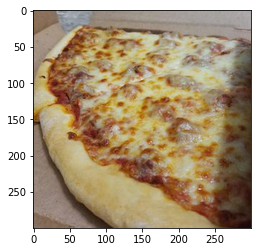

In [91]:
random_index = 20
print(filenames[random_index].split('/')[-1].split('.')[0])
distances, indices = neighbors.kneighbors([featuretensor_list[random_index]])
plt.imshow(mpimg.imread(filenames[random_index]), interpolation='lanczos')

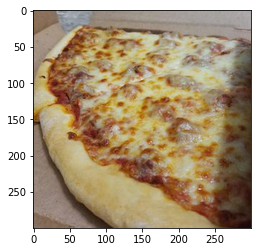

In [92]:
plt.imshow(mpimg.imread(filenames[indices[0][0]]), interpolation='lanczos')

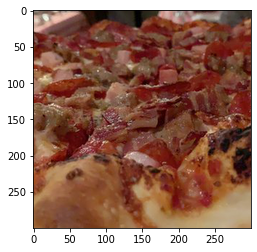

In [94]:
plt.imshow(mpimg.imread(filenames[indices[0][2]]), interpolation='lanczos')

In [120]:
apart2

<tf.Tensor: shape=(1, 64), dtype=float32, numpy=
array([[1.1191238 , 0.        , 0.4273147 , 0.        , 0.        ,
        1.0270787 , 0.3987035 , 0.        , 0.2897739 , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 1.5317378 , 0.09443825, 0.        , 0.00446777,
        0.        , 0.        , 0.30784902, 0.        , 0.        ,
        0.        , 0.        , 0.        , 1.8419851 , 0.        ,
        0.447735  , 0.        , 0.41226494, 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.03716054,
        0.        , 0.        , 0.22442544, 0.        , 0.        ,
        0.        , 0.        , 0.        , 1.7905525 , 0.        ,
        0.        , 0.        , 0.5338802 , 0.6811141 , 0.        ,
        0.        , 0.        , 0.8679581 , 0.        , 0.        ,
        1.1879715 , 0.        , 0.        , 0.        ]], dtype=float32)>

In [101]:
# Helper function to get the classname
def classname(str):
    return str.split('/')[-2]


# Helper function to get the classname and filename
def classname_filename(str):
    return str.split('/')[-2] + '/' + str.split('/')[-1]


# Helper functions to plot the nearest images given a query image
def plot_images(filenames, distances):
    images = []
    for filename in filenames:
        images.append(mpimg.imread(filename))
    plt.figure(figsize=(20, 10))
    columns = 4
    for i, image in enumerate(images):
        ax = plt.subplot(len(images) / columns + 1, columns, i + 1)
        if i == 0:
            ax.set_title("Query Image\n" + filenames[i].split('/')[-1].split('.')[0])
        else:
            ax.set_title("Similar Image\n" + filenames[i].split('/')[-1].split('.')[0] +
                         "\nDistance: " +
                         str(float("{0:.2f}".format(distances[i]))))
        plt.imshow(image)
        # To save the plot in a high definition format i.e. PDF, uncomment the following line:
        #plt.savefig('results/' + str(random.randint(0,10000))+'.pdf', format='pdf', dpi=1000)
        # We will use this line repeatedly in our code.

        # Earlier title code: classname_filename(filenames[i]

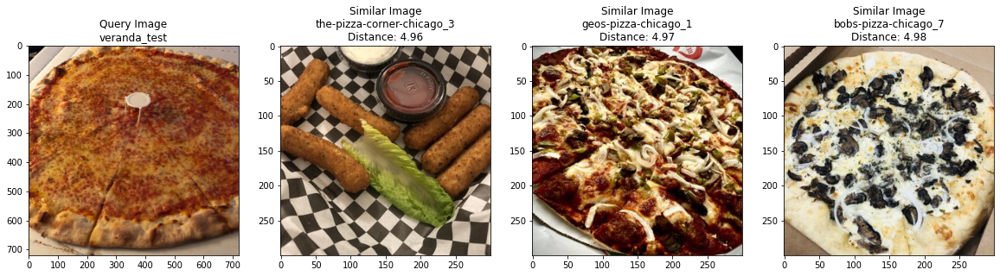

In [122]:
# Find nearest three neighbors for Apart image
distances, indices = neighbors.kneighbors(apart_features)
# Since this image is from outside our images, first image is ok to take as recommendation
similar_image_paths = ['/content/drive/MyDrive/ds/pizza_images/autoencoder/test/veranda_test.jpg'] + \
        [filenames[indices[0][i]] for i in range(0, 3)]
plot_images(similar_image_paths, distances[0])
# /content/drive/MyDrive/ds/pizza_images/autoencoder/test/veranda_test.jpg

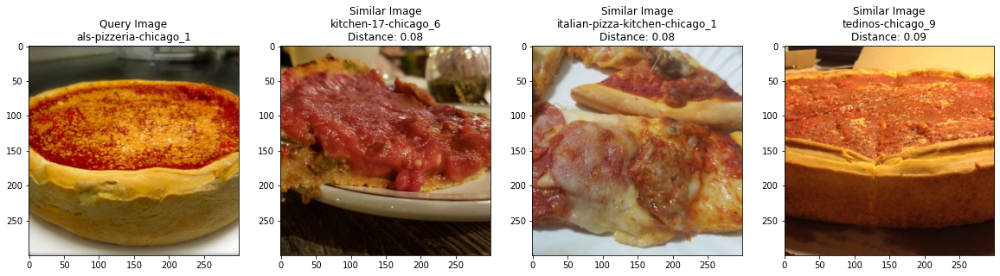

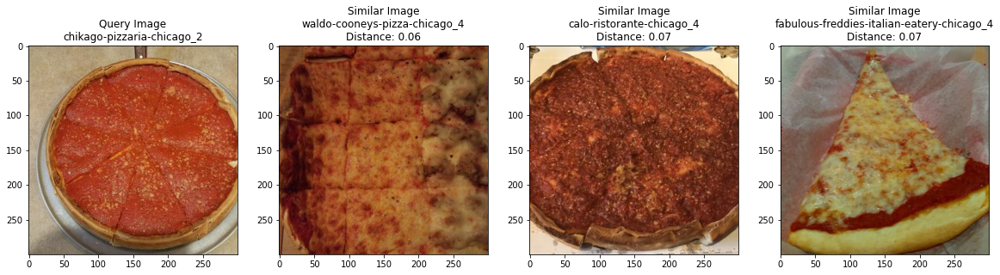

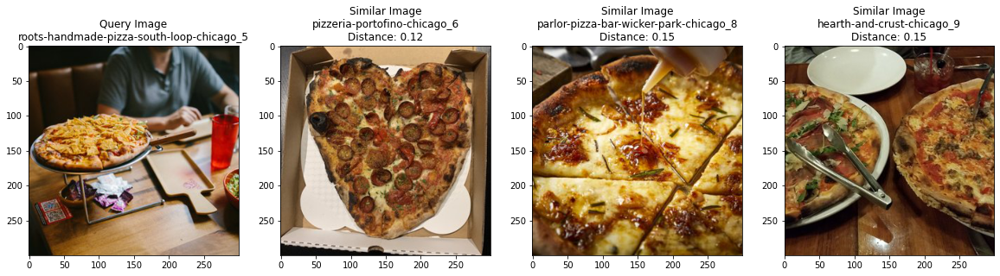

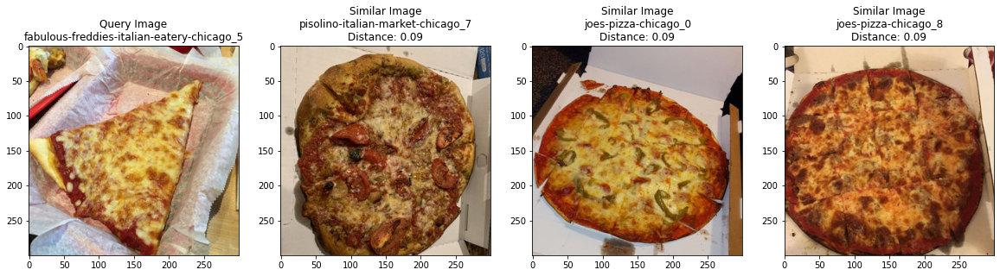

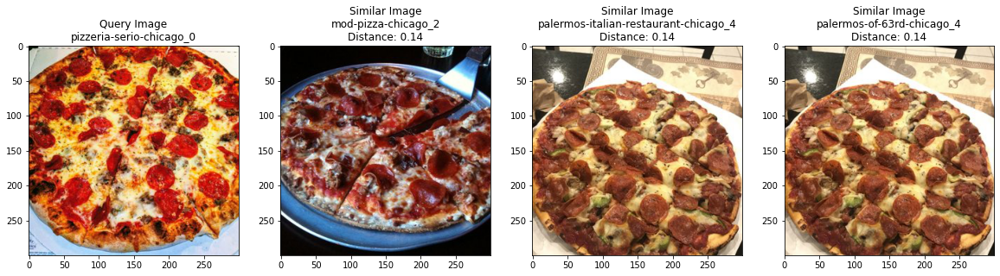

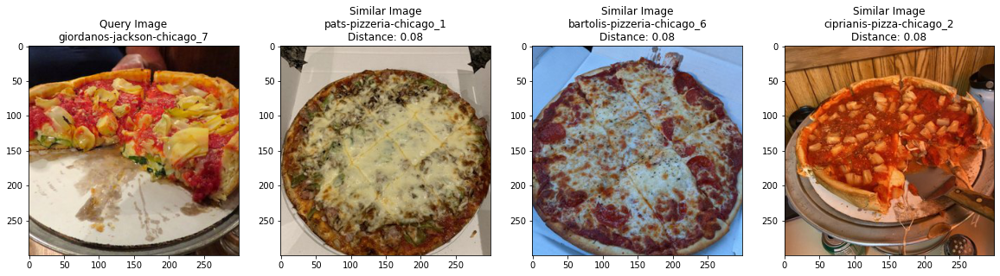

In [100]:
# Find nearest three neighbors to a few randomly chosen pizzas

for i in range(6):
    random_image_index = random.randint(0, num_images)
    distances, indices = neighbors.kneighbors(
        [featuretensor_list[random_image_index]])
    # Don't take the first closest image as it will be the same image
    similar_image_paths = [filenames[random_image_index]] + \
        [filenames[indices[0][i]] for i in range(1, 4)]
    plot_images(similar_image_paths, distances[0])

In [ ]:
# How close are the images to each other

neighbors = NearestNeighbors(n_neighbors=len(feature_list),
                             algorithm='brute',
                             metric='euclidean').fit(feature_list)
distances, indices = neighbors.kneighbors(feature_list)

# Calculating some stats
print("Median distance between all photos: ", np.median(distances))
print("Max distance between all photos: ", np.max(distances))
print("Median distance among most similar photos: ",
      np.median(distances[:, 2]))

Median distance between all photos:  0.85527223
Max distance between all photos:  1.1877428
Median distance among most similar photos:  0.69356436


In [ ]:
selected_features = feature_list[:]
selected_class_ids = class_ids[:]
selected_filenames = filenames[:]

In [ ]:
from sklearn.manifold import TSNE

# You can play with these values and see how the results change
n_components = 2
verbose = 1
perplexity = 30
n_iter = 1000
metric = 'euclidean'

time_start = time.time()
tsne_results = TSNE(n_components=n_components,
                    verbose=verbose,
                    perplexity=perplexity,
                    n_iter=n_iter,
                    metric=metric).fit_transform(selected_features)

print('t-SNE done! Time elapsed: {} seconds'.format(time.time() - time_start))

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 2023 samples in 0.525s...
[t-SNE] Computed neighbors for 2023 samples in 21.463s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2023
[t-SNE] Computed conditional probabilities for sample 2000 / 2023
[t-SNE] Computed conditional probabilities for sample 2023 / 2023
[t-SNE] Mean sigma: 0.160971
[t-SNE] KL divergence after 250 iterations with early exaggeration: 77.333282
[t-SNE] KL divergence after 1000 iterations: 2.082243
t-SNE done! Time elapsed: 42.27052593231201 seconds


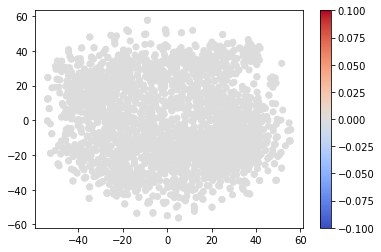

In [ ]:
color_map = plt.cm.get_cmap('coolwarm')
scatter_plot = plt.scatter(tsne_results[:, 0],
                           tsne_results[:, 1],
                           c=selected_class_ids,
                           cmap=color_map)
plt.colorbar(scatter_plot)
plt.show()
# To save the plot in a high definition format i.e. PDF, uncomment the following line:
#plt.savefig('results/' + str(ADD_NAME_HERE)+'.pdf', format='pdf', dpi=1000)

In [ ]:
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
from matplotlib.cbook import get_sample_data


def plot_images_in_2d(x, y, image_paths, axis=None, zoom=1):
    if axis is None:
        axis = plt.gca()
    x, y = np.atleast_1d(x, y)
    for x0, y0, image_path in zip(x, y, image_paths):
        image = Image.open(image_path)
        image.thumbnail((100, 100), Image.ANTIALIAS)
        img = OffsetImage(image, zoom=zoom)
        anno_box = AnnotationBbox(img, (x0, y0),
                                  xycoords='data',
                                  frameon=False)
        axis.add_artist(anno_box)
    axis.update_datalim(np.column_stack([x, y]))
    axis.autoscale()

In [ ]:
def show_tsne(x, y, selected_filenames):
    fig, axis = plt.subplots()
    fig.set_size_inches(22, 22, forward=True)
    plot_images_in_2d(x, y, selected_filenames, zoom=0.3, axis=axis)
    plt.show()

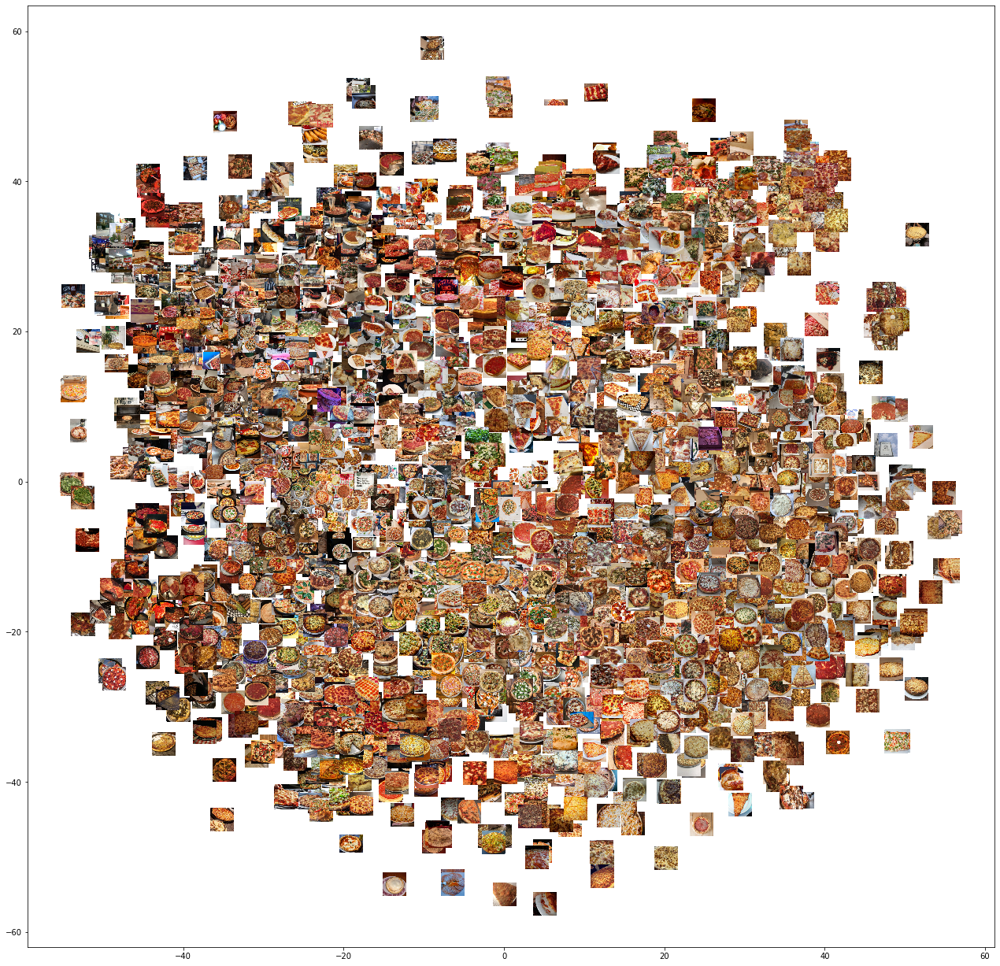

In [ ]:

show_tsne(tsne_results[:, 0], tsne_results[:, 1], selected_filenames)

In [ ]:
def tsne_to_grid_plotter_manual(x, y, selected_filenames):
    S = 2000
    s = 100
    x = (x - min(x)) / (max(x) - min(x))
    y = (y - min(y)) / (max(y) - min(y))
    x_values = []
    y_values = []
    filename_plot = []
    x_y_dict = {}
    for i, image_path in enumerate(selected_filenames):
        a = np.ceil(x[i] * (S - s))
        b = np.ceil(y[i] * (S - s))
        a = int(a - np.mod(a, s))
        b = int(b - np.mod(b, s))
        if str(a) + "|" + str(b) in x_y_dict:
            continue
        x_y_dict[str(a) + "|" + str(b)] = 1
        x_values.append(a)
        y_values.append(b)
        filename_plot.append(image_path)
    fig, axis = plt.subplots()
    fig.set_size_inches(22, 22, forward=True)
    plot_images_in_2d(x_values, y_values, filename_plot, zoom=.58, axis=axis)
    plt.show()

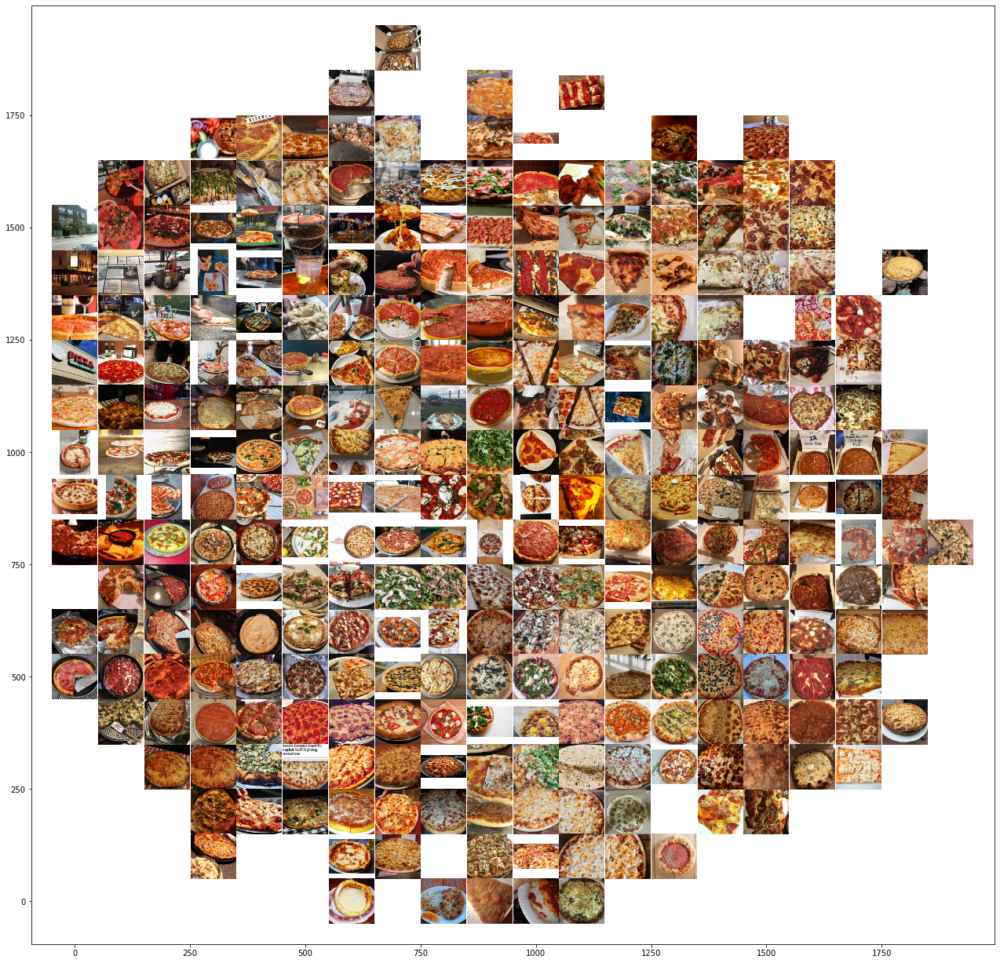

In [ ]:
tsne_to_grid_plotter_manual(tsne_results[:, 0], tsne_results[:, 1],
                            selected_filenames)

In [ ]:
# Making recommendations from a new image

def extract_features(img_path, model):
    input_shape = (224, 224, 3)
    img = image.load_img(img_path,
                         target_size=(input_shape[0], input_shape[1]))
    img_array = image.img_to_array(img)
    expanded_img_array = np.expand_dims(img_array, axis=0)
    preprocessed_img = preprocess_input(expanded_img_array)
    features = model.predict(preprocessed_img)
    flattened_features = features.flatten()
    normalized_features = flattened_features / norm(flattened_features)
    return normalized_features